# **PROJECT: IMAGE CLASSIFICATION**

In [1]:
import numpy as np
import pandas as pd

import os
import cv2

from google.colab.patches import cv2_imshow
from matplotlib.pyplot import imshow
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image

from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.preprocessing import StandardScaler

from google.colab import drive
drive.mount("/content/drive", force_remount=True)
from google.colab import files

import torch
from torch.utils.data import Dataset, DataLoader
import torch.nn as nn
import torch.optim as optim
from torchvision import transforms
from torch.nn.utils import clip_grad_norm_

Mounted at /content/drive


# **Computer vison** ✅

In [2]:
file_path = "/content/drive/MyDrive/Colab Notebooks/kirmizi-siirt/annotations.csv"
df = pd.read_csv(file_path)
df

,filename,label
0,kirmizi (1).jpg,0
1,kirmizi (10).jpg,0
2,kirmizi (11).jpg,0
3,kirmizi (12).jpg,0
4,kirmizi (13).jpg,0
...,...,...
2143,siirt 95.jpg,1
2144,siirt 96.jpg,1
2145,siirt 97.jpg,1
2146,siirt 98.jpg,1


In [3]:
# for i in image_feature:
#   a = os.path.join("/content/drive/MyDrive/Colab Notebooks/kirmizi-siirt/Kirmizi_Pistachio", i)
#   print(cv2.imread(a).shape)
#   b = cv2.resize(cv2.imread(a), (128, 128))
#   print(b.shape)
#   print(b.flatten().shape)
#   print(b.flatten().reshape(1, -1).shape)
#   print(np.unique(b))
#   print(b.dtype)
#   break

In [4]:
annotations = {}
image_feature = []
train_images = []
train_labels = []

for i in df["filename"]:
  image_feature.append(i)
  if "kirmizi" in i:
      annotations[i] = {"label": "kirmizi"}
  elif "siirt" in i:
      annotations[i] = {"label": "siirt"}


for i in df["label"]:
    train_labels.append(i)


path_1, path_2 = "/content/drive/MyDrive/Colab Notebooks/kirmizi-siirt/Kirmizi_Pistachio", "/content/drive/MyDrive/Colab Notebooks/kirmizi-siirt/Siirt_Pistachio"
for i in image_feature:
  read_path = os.path.join(path_1, i) if i in os.listdir(path_1) else os.path.join(path_2, i)
  if os.path.exists(read_path):
    image = cv2.imread(read_path)
    image = cv2.resize(image, (128, 128))
    train_images.append(image)

In [5]:
train_images = np.array(train_images).astype("float32")
train_labels = np.array(train_labels).reshape(-1, 1).astype(int)

In [6]:
X = train_images
y = train_labels

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

X_train = X_train.reshape(-1, 3 * 128 * 128)
X_test = X_test.reshape(X_test.shape[0], -1)

knn = cv2.ml.KNearest_create()
knn.train(X_train, cv2.ml.ROW_SAMPLE, y_train)

k_values = [1, 2, 3, 4, 5]
confusion_matrix_list = []
for k in k_values:
  ret, result, neighbours, dist = knn.findNearest(X_test, k=k)
  confusion_matrix_list.append(confusion_matrix(y_test, result))
  print(f"The accuracy of k = {k} is {accuracy_score(y_test, result):.2f}")

print("\n")
for i in confusion_matrix_list:
  print(i)

The accuracy of k = 1 is 0.80
The accuracy of k = 2 is 0.82
The accuracy of k = 3 is 0.83
The accuracy of k = 4 is 0.83
The accuracy of k = 5 is 0.83


[[183  61]
 [ 23 163]]
[[208  36]
 [ 42 144]]
[[191  53]
 [ 18 168]]
[[196  48]
 [ 27 159]]
[[188  56]
 [ 18 168]]


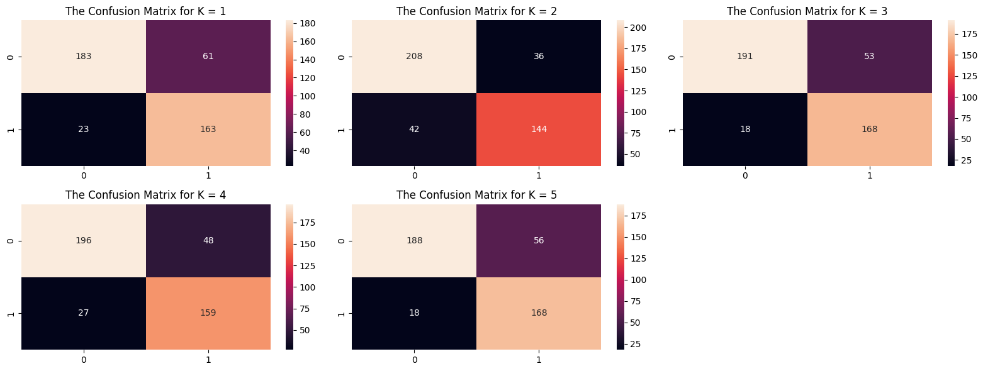

In [7]:
fig, axes = plt.subplots(2, 3, figsize=(16, 6))

for i, (matrix, k) in enumerate(zip(confusion_matrix_list[:3], k_values[:3])):
  sns.heatmap(pd.DataFrame(matrix), annot=True, fmt="d" ,ax=axes[0, i])
  axes[0, i].set_title(f"The Confusion Matrix for K = {k}")

for i, (matrix, k) in enumerate(zip(confusion_matrix_list[3:5], k_values[3:5])):
  sns.heatmap(pd.DataFrame(matrix), annot=True, fmt="d", ax=axes[1, i])
  axes[1, i].set_title(f"The Confusion Matrix for K = {k}")

for ax in axes.flat:
  if not ax.has_data():
    ax.axis('off')

plt.tight_layout()
plt.show()

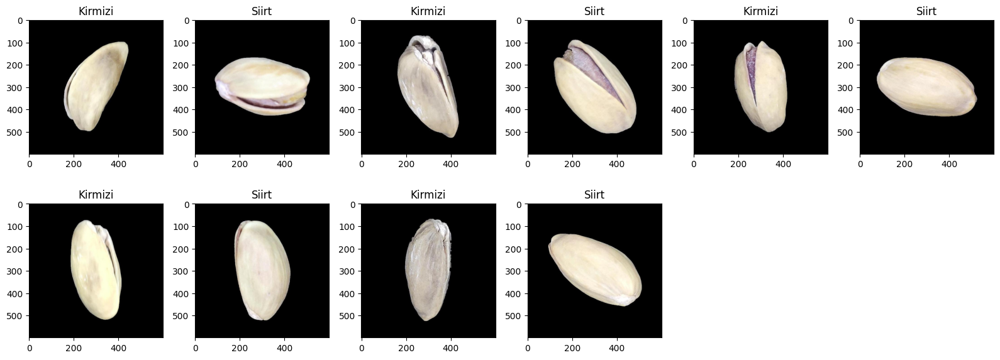

In [8]:
fig, axes = plt.subplots(2, 6, figsize=(16, 6))

for i, (ki, si) in enumerate(zip(os.listdir(path_1)[:3], os.listdir(path_2)[:3])):
  axes[0, 2 * i].imshow(cv2.cvtColor(cv2.imread(os.path.join(path_1, ki)), cv2.COLOR_BGR2RGB))
  axes[0, 2 * i].set_title("Kirmizi")
  axes[0, 2 * i + 1].imshow(cv2.cvtColor(cv2.imread(os.path.join(path_2, si)), cv2.COLOR_BGR2RGB))
  axes[0, 2 * i + 1].set_title("Siirt")


for i, (ki, si) in enumerate(zip(os.listdir(path_1)[10:12], os.listdir(path_2)[3:5])):
  axes[1, 2 * i].imshow(cv2.cvtColor(cv2.imread(os.path.join(path_1, ki)), cv2.COLOR_BGR2RGB))
  axes[1, 2 * i].set_title("Kirmizi")
  axes[1, 2 * i + 1].imshow(cv2.cvtColor(cv2.imread(os.path.join(path_2, si)), cv2.COLOR_BGR2RGB))
  axes[1, 2 * i + 1].set_title("Siirt")


for ax in axes.flat:
  if not ax.has_data():
    ax.axis('off')

plt.tight_layout()
plt.show()

In [9]:
knn.save(os.path.join("/content/drive/MyDrive/Colab Notebooks/kirmizi-siirt/", "knn_model.yml"))

In [10]:
knn = cv2.ml.KNearest_load(os.path.join("/content/drive/MyDrive/Colab Notebooks/kirmizi-siirt/", "knn_model.yml"))

def predict_label(image_path):
    read_path = os.path.join(path_1, image_path) if image_path in os.listdir(path_1) else os.path.join(path_2, image_path)
    if os.path.exists(read_path):
      image = cv2.cvtColor(cv2.imread(read_path), cv2.COLOR_BGR2RGB)
      image = cv2.resize(image, (128, 128))
      image = image.flatten().reshape(1, -1).astype("float32")
      ret, result, neighbours, dist = knn.findNearest(image, k=3)
      return  result, "Kirmizi" if result[0][0] == 0 else "Siirt"

image_test = predict_label("kirmizi (52).jpg")
print(image_test[0])
print(f"Predict Label: {image_test[1]}")

[[1.]]
Predict Label: Siirt


In [11]:
# file_up = files.upload()
# knn = cv2.ml.KNearest_load(os.path.join("/content/drive/MyDrive/Colab Notebooks/kirmizi-siirt/", "knn_model.yml"))

# def predict_label(image_path):
#     read_path = os.path.join(path_1, image_path) if image_path in os.listdir(path_1) else os.path.join(path_2, image_path)
#     if os.path.exists(read_path):
#       image = cv2.cvtColor(cv2.imread(read_path), cv2.COLOR_BGR2RGB)
#       image = cv2.resize(image, (128, 128))
#       image = image.flatten().reshape(1, -1).astype("float32")
#       ret, result, neighbours, dist = load_knn.findNearest(image, k=3)
#       return  result, "Kirmizi" if result[0][0] == 0 else "Siirt"

# image_test = predict_label("kirmizi (30).jpg")
# print(image_test[0])
# print(f"Predict Label: {image_test[1]}")

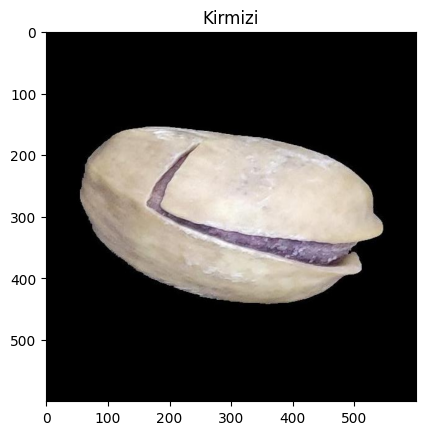

In [12]:
read_path = os.path.join(path_1, "kirmizi (52).jpg")
if os.path.exists(read_path):
  image = cv2.cvtColor(cv2.imread(read_path), cv2.COLOR_BGR2RGB)
  plt.title("Kirmizi")
  plt.imshow(image)
plt.show()

# **Deep learning** ✅

In [13]:
pd.read_csv("/content/drive/MyDrive/Colab Notebooks/kirmizi-siirt/annotations.csv")

,filename,label
0,kirmizi (1).jpg,0
1,kirmizi (10).jpg,0
2,kirmizi (11).jpg,0
3,kirmizi (12).jpg,0
4,kirmizi (13).jpg,0
...,...,...
2143,siirt 95.jpg,1
2144,siirt 96.jpg,1
2145,siirt 97.jpg,1
2146,siirt 98.jpg,1


In [14]:
pd.read_csv("/content/drive/MyDrive/Colab Notebooks/kirmizi-siirt/Pistachio_28_Features_Dataset.csv")

,Area,Perimeter,Major_Axis,Minor_Axis,Eccentricity,Eqdiasq,Solidity,Convex_Area,Extent,Aspect_Ratio,...,StdDev_RR,StdDev_RG,StdDev_RB,Skew_RR,Skew_RG,Skew_RB,Kurtosis_RR,Kurtosis_RG,Kurtosis_RB,Class
0,63391,1568.4050,390.3396,236.7461,0.7951,284.0984,0.8665,73160,0.6394,1.6488,...,17.7206,19.6024,21.1342,0.4581,0.6635,0.7591,2.9692,3.0576,2.9542,Kirmizi_Pistachio
1,68358,1942.1870,410.8594,234.7525,0.8207,295.0188,0.8765,77991,0.6772,1.7502,...,26.7061,27.2112,25.1035,-0.3847,-0.2713,-0.2927,1.9807,2.1006,2.2152,Kirmizi_Pistachio
2,73589,1246.5380,452.3630,220.5547,0.8731,306.0987,0.9172,80234,0.7127,2.0510,...,19.0129,20.0703,20.7006,-0.6014,-0.4500,0.2998,3.5420,3.6856,4.1012,Kirmizi_Pistachio
3,71106,1445.2610,429.5291,216.0765,0.8643,300.8903,0.9589,74153,0.7028,1.9879,...,18.1773,18.7152,29.7883,-0.6943,-0.6278,-0.7798,2.8776,2.8748,2.8953,Kirmizi_Pistachio
4,80087,1251.5240,469.3783,220.9344,0.8823,319.3273,0.9657,82929,0.7459,2.1245,...,23.4298,24.0878,23.1157,-0.9287,-0.8134,-0.4970,2.9915,2.8813,2.7362,Kirmizi_Pistachio
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2143,85983,1157.1160,444.3447,248.8627,0.8284,330.8730,0.9823,87536,0.6799,1.7855,...,20.8474,20.8118,21.1175,-0.6994,-0.7071,-0.6963,2.8853,2.6599,2.6317,Siirt_Pistachio
2144,85691,2327.3459,439.8794,278.9297,0.7732,330.3107,0.8886,96439,0.6590,1.5770,...,21.2621,22.5004,21.5821,-0.5567,-0.4968,-0.6597,2.3022,2.2664,2.5161,Siirt_Pistachio
2145,101136,1255.6190,475.2161,271.3299,0.8210,358.8459,0.9888,102286,0.7584,1.7514,...,21.1262,20.0279,17.4401,-0.9072,-0.8790,-0.4470,3.3112,3.4306,3.0697,Siirt_Pistachio
2146,97409,1195.2150,452.1823,274.5764,0.7945,352.1718,0.9902,98376,0.7635,1.6468,...,19.3274,19.1782,19.8930,-0.9473,-0.8404,-0.3153,3.4237,2.9606,3.0033,Siirt_Pistachio


In [15]:
class Image_Feature(Dataset):
  def __init__(self, dir):
    self.df = pd.read_csv(dir)
    self.images = self.df["filename"]
  def __len__(self):
    return len(self.df)
  def __getitem__(self, index):
    read_path = os.path.join(path_1, self.images.iloc[index]) if self.images.iloc[index] in os.listdir(path_1) else os.path.join(path_2, self.images.iloc[index])
    image = None
    if os.path.exists(read_path):
      image = cv2.cvtColor(cv2.imread(read_path), cv2.COLOR_BGR2RGB)

    return image


class Numerical_Feature(Dataset):
  def __init__(self, dir):
    self.df = pd.read_csv(dir)
    self.length = self.df.shape[0]
    self.data = self.df.drop(["Area", "Class"], axis = 1)
  def __len__(self):
    return self.length
  def __getitem__(self, index):
    data = self.data.iloc[index].values
    return data


class Combined_Image_Numeric(Dataset):
  def __init__(self, data_1, data_2, dir, transform = None):
    self.data_1 = data_1
    self.data_2 = data_2
    self.dir = pd.read_csv(dir)
    self.label = self.dir["Class"]
    self.transform = transform
  def __len__(self):
    return len(self.data_1)
  def __getitem__(self, index):
    image = self.data_1[index]
    numeric = self.data_2[index]
    label = self.label[index]
    label = 0 if label == "Kirmizi_Pistachio" else 1

    if self.transform:
      image = self.transform(image)

    numeric = torch.tensor(numeric, dtype= torch.float32)
    label = torch.tensor(label, dtype= torch.long)
    return image, numeric, label


transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize((128, 128)),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])

file_1 = Image_Feature("/content/drive/MyDrive/Colab Notebooks/kirmizi-siirt/annotations.csv")
file_2 = Numerical_Feature("/content/drive/MyDrive/Colab Notebooks/kirmizi-siirt/Pistachio_28_Features_Dataset.csv")

scaler = StandardScaler()
numeric_scaler = scaler.fit_transform(file_2.data)

my_data = Combined_Image_Numeric(file_1, numeric_scaler, "/content/drive/MyDrive/Colab Notebooks/kirmizi-siirt/Pistachio_28_Features_Dataset.csv", transform)

train_data, test_data = train_test_split(my_data, test_size = 0.2, shuffle=True, random_state=42)

train_loader = DataLoader(train_data, batch_size = 10, shuffle=True)
test_loader = DataLoader(test_data, batch_size = 10, shuffle=False)

In [17]:
class CNN_For_Image(nn.Module):
  def __init__(self):
    super(CNN_For_Image, self).__init__()
    self.image_layers = nn.Sequential(
        nn.Conv2d(3, 16, kernel_size=3, stride=1, padding=1), nn.ReLU(),
        nn.MaxPool2d(kernel_size=2, stride=2),   # 64

        nn.Conv2d(16, 32, kernel_size=3, stride=1, padding=1), nn.ReLU(),
        nn.MaxPool2d(kernel_size=2, stride=2),   # 32

        nn.Conv2d(32, 64, kernel_size=3, stride=1, padding=1), nn.ReLU(),
        nn.MaxPool2d(kernel_size=2, stride=2),   # 16
    )

    self.fc_layers = nn.Sequential(
        nn.Linear(64 * 16 * 16, 128), nn.ReLU(),
    )
    self.numeric_layers = nn.Sequential(
        nn.Linear(27, 128),
        nn.ReLU()
    )

    self.combined_layers = nn.Sequential(
        nn.Linear(256, 64), nn.ReLU(),
        nn.Linear(64, 1)
    )

    self.apply(self._init_weights)
  def _init_weights(self, m):
      if isinstance(m, nn.Conv2d) or isinstance(m, nn.Linear):
        nn.init.xavier_uniform_(m.weight)
        if m.bias is not None:
          nn.init.constant_(m.bias, 0)

  def forward(self, image, numeric):
    x1 = self.image_layers(image)
    x1 = x1.view(x1.size(0), -1)
    x1 = self.fc_layers(x1)

    x2 = self.numeric_layers(numeric)

    x = torch.cat((x1, x2), dim=1)
    x = self.combined_layers(x)
    return x

model = CNN_For_Image()
criterion = nn.BCEWithLogitsLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)
scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=2, gamma=0.1)

model.train()
for epoch in range(10):
  current_loss = 0
  for i, (image, numeric, label) in enumerate(train_loader):
    optimizer.zero_grad()
    output = model(image, numeric)
    loss = criterion(output, label.unsqueeze(1).float())
    loss.backward()
    clip_grad_norm_(model.parameters(), max_norm=1.0)
    optimizer.step()

    current_loss += loss.item()
    if i % 34 == 33:
      print(f"The loss of epoch {epoch + 1}, batch {i + 1}: {current_loss / 34:.2f}")
      current_loss = 0
  scheduler.step()
  torch.cuda.empty_cache()


The loss of epoch 1, batch 34: 0.44
The loss of epoch 1, batch 68: 0.29
The loss of epoch 1, batch 102: 0.27
The loss of epoch 1, batch 136: 0.23
The loss of epoch 1, batch 170: 0.17
The loss of epoch 2, batch 34: 0.20
The loss of epoch 2, batch 68: 0.14
The loss of epoch 2, batch 102: 0.19
The loss of epoch 2, batch 136: 0.09
The loss of epoch 2, batch 170: 0.10
The loss of epoch 3, batch 34: 0.08
The loss of epoch 3, batch 68: 0.15
The loss of epoch 3, batch 102: 0.11
The loss of epoch 3, batch 136: 0.09
The loss of epoch 3, batch 170: 0.08
The loss of epoch 4, batch 34: 0.08
The loss of epoch 4, batch 68: 0.08
The loss of epoch 4, batch 102: 0.11
The loss of epoch 4, batch 136: 0.09
The loss of epoch 4, batch 170: 0.07
The loss of epoch 5, batch 34: 0.11
The loss of epoch 5, batch 68: 0.05
The loss of epoch 5, batch 102: 0.12
The loss of epoch 5, batch 136: 0.06
The loss of epoch 5, batch 170: 0.06
The loss of epoch 6, batch 34: 0.12
The loss of epoch 6, batch 68: 0.06
The loss of e

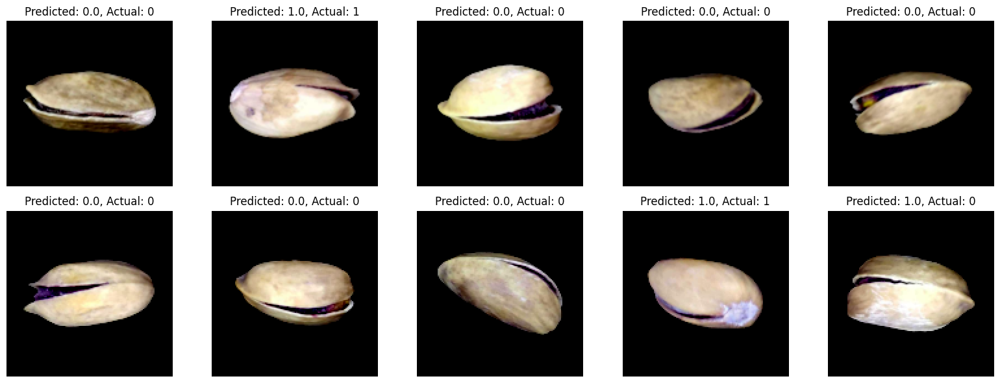

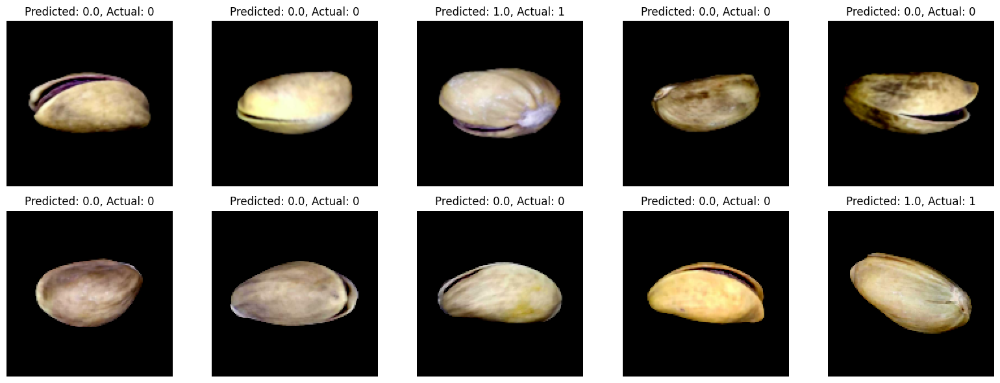

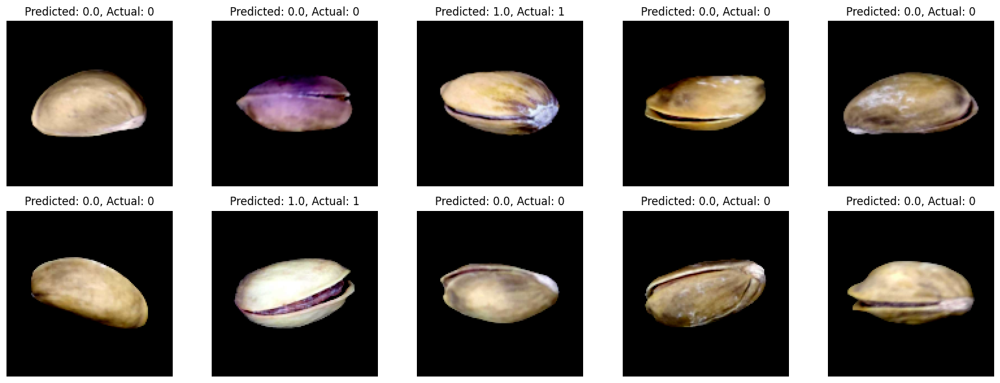

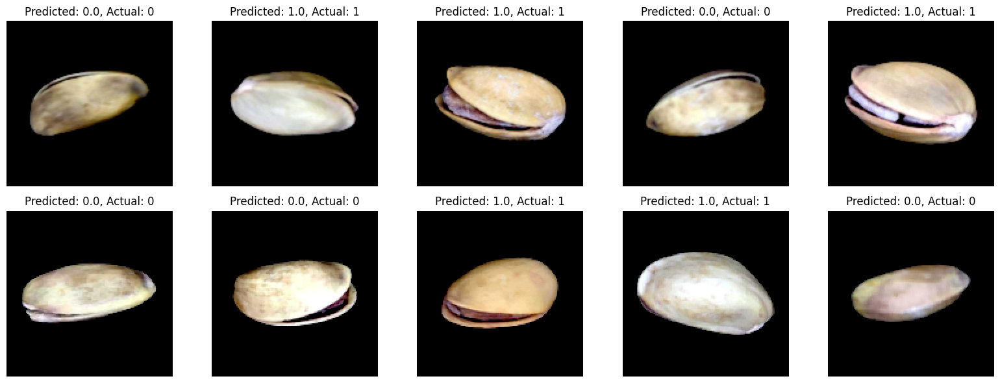

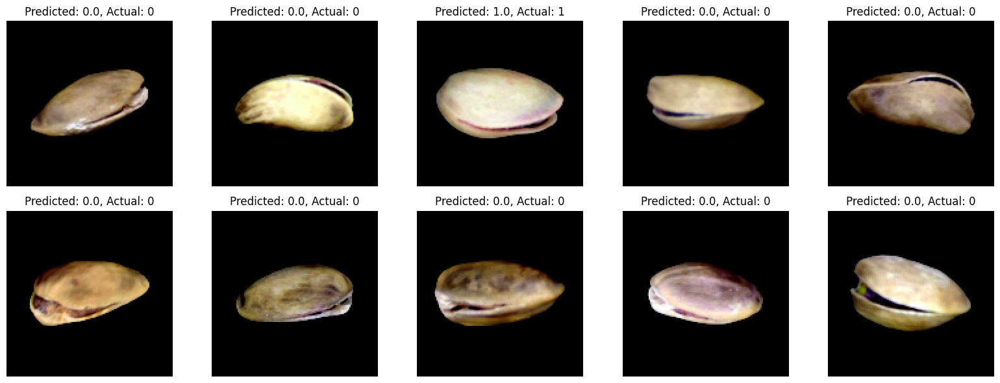

...

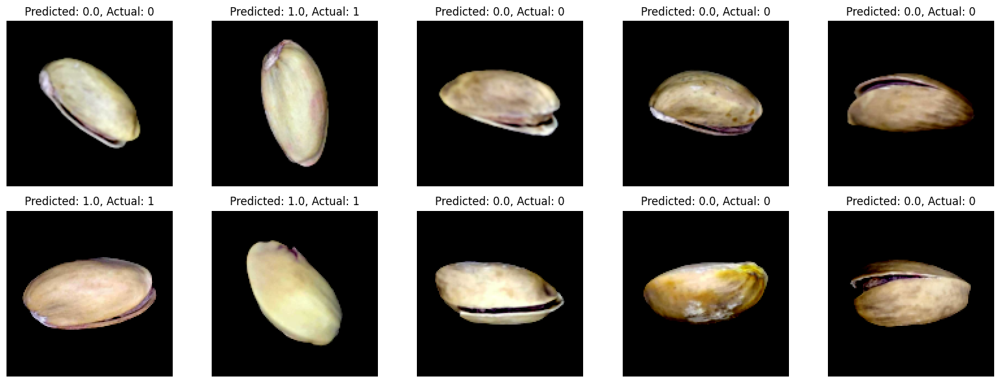

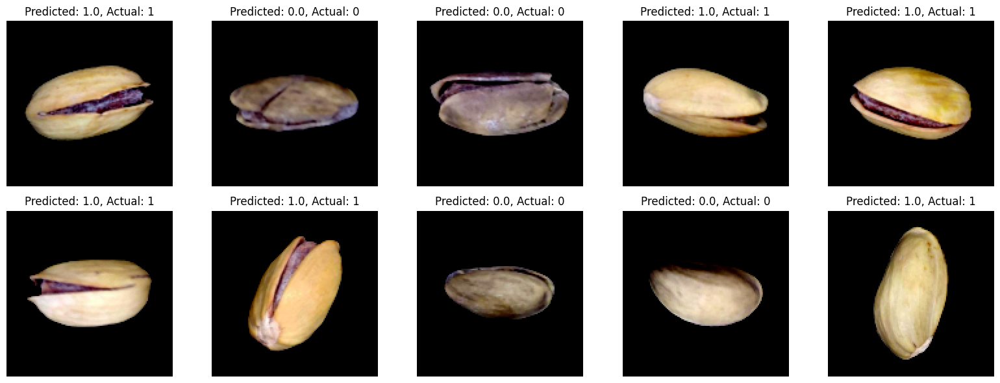

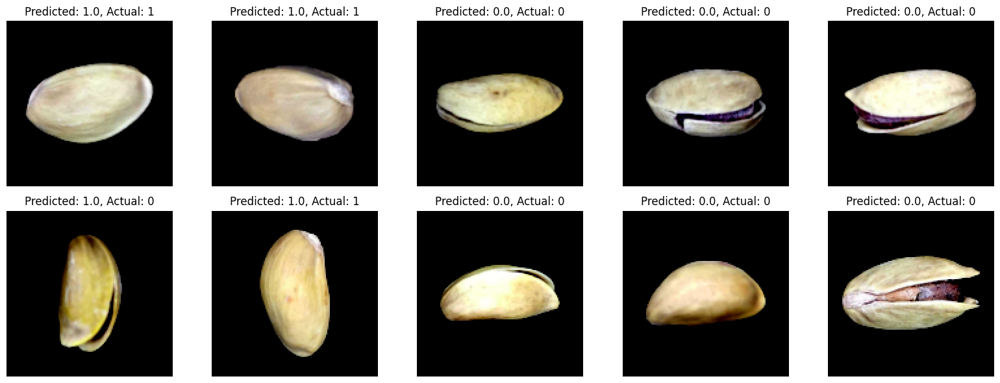

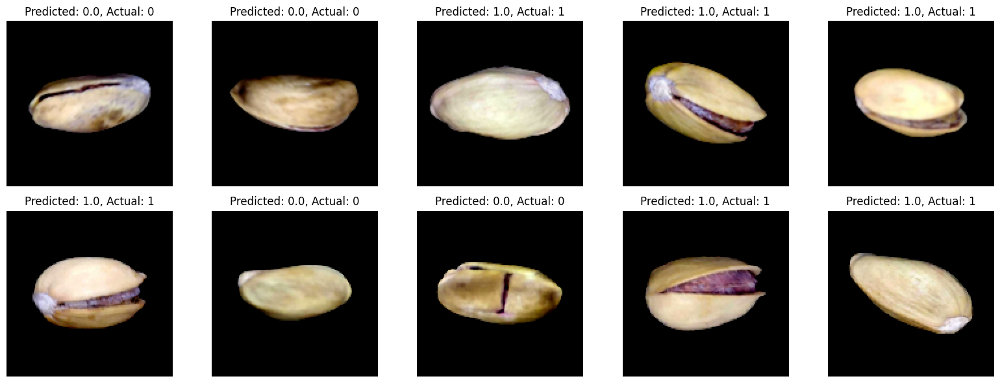

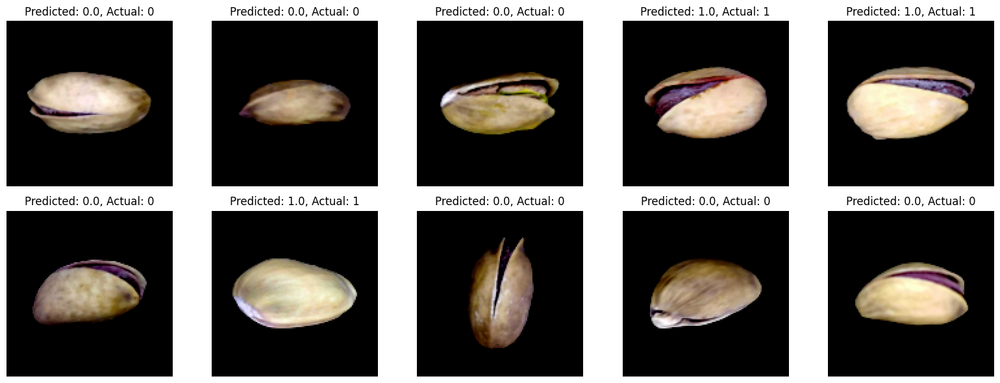

The accuracy is: 0.9790697674418605


In [18]:
model.eval()
with torch.no_grad():
  correct = 0
  total = 0
  for image, numeric, label in test_loader:
    output = model(image, numeric)
    predicted = torch.round(torch.sigmoid(output))
    total += label.size(0)
    correct += (predicted == label.unsqueeze(1)).sum().item()

    plt.figure(figsize = (16, 6))
    for i in range(label.size(0)):
      plt.subplot(2, 5, i + 1)
      img = image[i].permute(2, 1, 0).numpy()
      img = np.clip(img * 255, 0, 255).astype(np.uint8)
      plt.imshow(img)
      plt.title(f"Predicted: {predicted[i].item()}, Actual: {label[i].item()}")
      plt.axis("off")
    plt.tight_layout()
    plt.show()

accuracy = correct / total
print(f"The accuracy is: {accuracy}") # 96.5%

# **The End**